In [2]:
import sys
import os
import numpy as np
from matplotlib import pyplot as plt
from collections import Counter
import datetime
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

In [3]:
# tensorflow imports
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dropout, Conv2D, MaxPooling2D, GlobalMaxPooling2D, Dense, Flatten
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications import VGG19, VGG16, ResNet50
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [4]:
# check GPU support
!python --version
print("\nNum GPUs Available:", len(tf.config.experimental.list_physical_devices('GPU')))

Python 3.7.10

Num GPUs Available: 1


## Input Data

### The input data is structured as follows:
- Training data: 483 Images (120 Olivine)
- Validation data: 103 Images (25 Olivine - 22 polygone-labeled)
- Test data: 104 Images (26 Olivine - all polygone-labeled)

Total images: **690**

Olivine Ratio: 171/690 = **25%**

Double-Check if the data input folder has the following structure:
- thin_section_dataset
    - train
        - olivine
        - non-olivine
    - validation
        - olivine
        - non-olivine
    - test
        - olivine
        - non-olivine

In [5]:
### Custom training for 6D rotational data

olivine_folder = 'thin_section_dataset_rotational/test/olivine/'
non_olivine_folder = 'thin_section_dataset_rotational/test/non-olivine/'

train_data = 'thin_section_dataset_rotational/train/'
val_data = 'thin_section_dataset_rotational/validation/'
test_data = 'thin_section_dataset_rotational/test/'

X_train = []
X_val = []
X_test = []

y_train = []
y_val = []
y_test = []

for subdir, dirs, files in os.walk(train_data):
    for npy_file in files:
        temp = np.load(os.path.join(subdir, npy_file))
        X_train.append(temp)
        if ('_NOLV' in npy_file):
            y_train.append(0.0)
        elif ('_OLV' in npy_file):
            y_train.append(1.0)
X_train = np.squeeze(np.array(X_train, dtype=np.float32), axis=(1,))
y_train = np.array(y_train, dtype=np.float32)

for subdir, dirs, files in os.walk(val_data):
    for npy_file in files:
        temp = np.load(os.path.join(subdir, npy_file))
        X_val.append(temp)
        if ('_NOLV' in npy_file):
            y_val.append(0.0)
        elif ('_OLV' in npy_file):
            y_val.append(1.0)
X_val = np.squeeze(np.array(X_val, dtype=np.float32), axis=(1,))
y_val = np.array(y_val, dtype=np.float32)

for subdir, dirs, files in os.walk(test_data):
    for npy_file in files:
        temp = np.load(os.path.join(subdir, npy_file))
        X_test.append(temp)
        if ('_NOLV' in npy_file):
            y_test.append(0.0)
        elif ('_OLV' in npy_file):
            y_test.append(1.0)
X_test = np.squeeze(np.array(X_test, dtype=np.float32), axis=(1,))
y_test = np.array(y_test, dtype=np.float32)


checkpoint_filepath = 'saved_models/binary_model'
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# define callbacks
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0.0001, patience=6, verbose=1,
    mode='auto', baseline=None, restore_best_weights=False
)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

callbacks = [model_checkpoint_callback, tensorboard_callback]

unique, counts = np.unique(y_train, return_counts=True)
class_weights = {0: 1.0, # Non-Olivine
                1: (counts[0]/counts[1])} # Olivine

In [5]:
# define basic cnn model
def define_base_model(learn_rate=0.001, input_shape=(224, 224, 3)):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))
    
    # compile model
    # opt = SGD(lr=0.001, momentum=0.9)
    opt = Adam(learning_rate=learn_rate)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [40]:
def rotational_training(input_shape=(224, 224, 6), batch_size=32, epochs=30, callbacks=callbacks, verbose=1):
    model = define_base_model(input_shape=input_shape)
    #model = VGG16(include_top=False, input_shape=input_shape)
    #opt = Adam(learning_rate=0.001)
    #model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    
    model.summary()
    
    history = model.fit(X_train,
                        y_train,
                        batch_size=batch_size,
                        epochs=epochs,
                        #callbacks=callbacks,
                        validation_data=(X_val,y_val),
                        steps_per_epoch = len(X_train)//batch_size,
                        validation_steps = len(X_val)//batch_size,
                        verbose=verbose,)
    return model, history

In [7]:
# define cnn model
def define_vgg_model(image_shape=(224, 224, 3), index=22):
    # load model
    model = VGG16(include_top=False, input_shape=image_shape)
    # mark loaded layers as not trainable
    for layer in model.layers:#[:index]:
        layer.trainable = False
    # add new classifier layers
    flat1 = Flatten()(model.layers[-1].output)
    class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)
    output = Dense(1, activation='sigmoid')(class1)
    # define new model
    model = Model(inputs=model.inputs, outputs=output)
    # compile model
    #opt = SGD(lr=0.001, momentum=0.9)
    opt = Adam(learning_rate=0.001)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

In [8]:
def define_vgg_model_new(image_shape=(224, 224, 3), index=22):
    pretrained_model = VGG16(input_shape=image_shape, include_top=False, weights="imagenet")
    for layer in pretrained_model.layers:
        layer.trainable = False
    last_layer = pretrained_model.get_layer('block5_pool')
    last_output = last_layer.output
    x = GlobalMaxPooling2D()(last_output)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(2, activation='sigmoid')(x)
    model = tf.keras.Model(pretrained_model.input, x)
    opt = Adam(learning_rate=0.001)
    model.compile(optimizer=opt, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=['acc'])

    return model

In [9]:
def define_custom_vgg_model(image_shape=(224, 224, 3), index=22, learn_rate=0.001):
    base_model = VGG19(include_top = False, weights = 'imagenet', input_shape = image_shape)
    opt = Adam(learning_rate=learn_rate)
    
    for layer in base_model.layers[:index]:
        layer.trainable = False
    # base_model.trainable = False # freeze layers from pretrained model

    model = Sequential()
    #model = Model(inputs=base_model.input, outputs=base_model.layers[-1].output) # copy all layers from base_model
    model.add(Rescaling(1./255,input_shape = image_shape))
    for layer in base_model.layers[1:-1]: # loop through convolution layers
        model.add(layer)
    model.add(base_model.get_layer('block5_pool')) # add final maxpooling2D layer
    model.add(Flatten())
    model.add(Dense(256,activation=('relu'))) 
    model.add(Dropout(.2))
    model.add(Dense(128,activation=('relu')))
    model.add(Dropout(.2))
    
    # Final layer
    model.add(Dense(1,activation=('sigmoid'),name="activation_1"))
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

In [10]:
def define_resnet50_model(image_shape=(224, 224, 3)):
    # Fixed for our Cats & Dogs classes
    NUM_CLASSES = 2

    # Fixed for Cats & Dogs color images
    CHANNELS = 3

    IMAGE_RESIZE = 224
    RESNET50_POOLING_AVERAGE = 'avg'
    DENSE_LAYER_ACTIVATION = 'sigmoid'
    OBJECTIVE_FUNCTION = 'sparse_categorical_crossentropy'

    # Common accuracy metric for all outputs, but can use different metrics for different output
    LOSS_METRICS = ['accuracy']

    # EARLY_STOP_PATIENCE must be < NUM_EPOCHS
    NUM_EPOCHS = 10
    EARLY_STOP_PATIENCE = 3

    # These steps value should be proper FACTOR of no.-of-images in train & valid folders respectively
    # Training images processed in each step would be no.-of-train-images / STEPS_PER_EPOCH_TRAINING
    STEPS_PER_EPOCH_TRAINING = 10
    STEPS_PER_EPOCH_VALIDATION = 10

    # These steps value should be proper FACTOR of no.-of-images in train & valid folders respectively
    # NOTE that these BATCH* are for Keras ImageDataGenerator batching to fill epoch step input
    BATCH_SIZE_TRAINING = 100
    BATCH_SIZE_VALIDATION = 100

    # Using 1 to easily manage mapping between test_generator & prediction for submission preparation
    BATCH_SIZE_TESTING = 1
    
    resnet_weights_path = './resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
    weights = 'imagenet'
    
    #Still not talking about our train/test data or any pre-processing.

    model = Sequential()

    # 1st layer as the lumpsum weights from resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
    # NOTE that this layer will be set below as NOT TRAINABLE, i.e., use it as is
    model.add(ResNet50(include_top = False, pooling = RESNET50_POOLING_AVERAGE, weights = weights))

    # 2nd layer as Dense for 2-class classification, i.e., dog or cat using SoftMax activation
    model.add(Dense(NUM_CLASSES, activation = DENSE_LAYER_ACTIVATION))

    # Say not to train first layer (ResNet) model as it is already trained
    model.layers[0].trainable = False
    
    sgd = SGD(lr = 0.01, decay = 1e-6, momentum = 0.9, nesterov = True)
    model.compile(optimizer = sgd, loss = OBJECTIVE_FUNCTION, metrics = LOSS_METRICS)
    
    return model

In [11]:
# run the test harness for evaluating a model
def run_test_harness(model_name='base', epochs=50, batch_size=32, index=22, verbose=1):
    # define model
    if model_name == 'base':
        model = define_base_model()
    elif model_name == 'vgg':
        model = define_vgg_model_new(index=index)
    elif model_name == 'custom_vgg':
        model = define_custom_vgg_model(index=index)
    elif model_name == 'resnet50':
        model = define_resnet50_model()
    
    # create data generators
    train_datagen = ImageDataGenerator(rescale=1.0/255.0,
                                       rotation_range=40,
                                       width_shift_range=0.2,
                                       height_shift_range=0.2,
                                       shear_range=0.2,
                                       zoom_range=0.2,
                                       brightness_range=[0.1,1],
                                       horizontal_flip=True,
                                       fill_mode='nearest')
    
    val_datagen = ImageDataGenerator(rescale=1.0/255.0)
    
    # prepare iterators
    train_generator = train_datagen.flow_from_directory('thin_section_dataset/train/',
                                                 class_mode='binary',
                                                 color_mode='rgb',
                                                 batch_size=batch_size,
                                                 target_size=(224, 224))
    
    val_generator = val_datagen.flow_from_directory('thin_section_dataset/validation/',
                                               class_mode='binary', 
                                               color_mode='rgb',
                                               batch_size=batch_size, 
                                               target_size=(224, 224))
    
    # calculate class weights
    counter = Counter(train_generator.classes)
    max_val = float(max(counter.values()))
    class_weights = {class_id : max_val/num_images for class_id, num_images in counter.items()}
    
    ### Debug info ###
    print(f"\nClasses: {train_generator.class_indices}")
    print(f"Class Weights: {class_weights}")
    print(f"Class Distribution: {dict(counter)}\n")
    
    # fit model
    history = model.fit(train_generator, 
                        steps_per_epoch=len(train_generator), 
                        validation_data=val_generator, 
                        validation_steps=len(val_generator),
                        class_weight=class_weights,
                        epochs=epochs, 
                        verbose=verbose,
                        callbacks=[
                            tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=20),
                            tf.keras.callbacks.ModelCheckpoint(f'models/model_{model_name}.h5',
                                           save_best_only=True,
                                           save_weights_only=False,
                                           monitor='val_accuracy')
                        ])
    
    return model, history

In [12]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
    # plot loss
    plt.subplot(211)
    plt.title('Cross Entropy Loss')
    plt.plot(history.history['loss'], color='blue')
    plt.plot(history.history['val_loss'], color='orange')
    plt.legend(['train', 'val'])
    
    # plot accuracy
    plt.subplot(212)
    plt.title('Classification Accuracy')
    plt.plot(history.history['accuracy'], color='blue')
    plt.plot(history.history['val_accuracy'], color='orange')
    plt.legend(['train', 'val']) 
    
    plt.subplots_adjust(top=1.6, right=1.2)
    
    plt.show()

In [13]:
def show_confusion_matrix(model, test_generator, batch_divisor=1):    
    test_steps_per_epoch = np.math.ceil(test_generator.samples / test_generator.batch_size)

    predictions = model.predict_generator(test_generator, steps=test_steps_per_epoch)
    predicted_classes = [1 * (x[0]>=0.5) for x in predictions]
    
    true_classes = test_generator.classes
    class_labels = list(test_generator.class_indices.keys()) 
    
    cm = confusion_matrix(true_classes, predicted_classes)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    
    disp.plot(cmap=plt.cm.Blues)
    plt.show()
    
    report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
    print(f'############## Debug ##############')
    print(f'true_classes: {true_classes}\nclass_labels: {class_labels}\ntest_generator.samples: {test_generator.samples}')
    print(report) 

In [19]:
def evaluate_model(model, history):
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    test_generator = test_datagen.flow_from_directory('thin_section_dataset/test/',
                                               class_mode='binary',
                                               color_mode='rgb',
                                               target_size=(224, 224),
                                               batch_size=1,
                                               shuffle=False,)
    # calculate test set accuracy
    _, acc = model.evaluate(test_generator, steps=len(test_generator), verbose=1)
    print('\nAccuracy on test set: %.3f' % (acc * 100.0))
    
    # plot learning curves
    summarize_diagnostics(history)
    
    # plot confusion matrix
    show_confusion_matrix(model, test_generator)

In [21]:
def evaluate_rotational_model(model, history):
    _, acc = model.evaluate(X_test, y_test, batch_size=1)
    print('\nAccuracy on test set: %.3f' % (acc * 100.0))
    
    # plot learning curves
    summarize_diagnostics(history)
    
    # confusion matrix
    predictions = model.predict(X_test, )
    predicted_classes = [1 * (x[0]>=0.5) for x in predictions]
    true_classes = y_test
    class_labels = ['non-olivine', 'olivine']
    
    cm = confusion_matrix(true_classes, predicted_classes)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(cmap=plt.cm.Blues)
    plt.show()
    
    report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
    print(report)

In [16]:
def load_image(img_path, show=True):

    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)                    # (height, width, channels)
    img_tensor = np.expand_dims(img_tensor, axis=0)         # (1, height, width, channels), add a dimension because the model expects this shape: (batch_size, height, width, channels)
    img_tensor /= 255.                                      # imshow expects values in the range [0, 1]

    if show:
        plt.imshow(img_tensor[0])                           
        plt.axis('off')
        plt.show()

    return img_tensor # np.array()

def show_prediction(img_path, model):
    print(img_path)
    # load a single image
    new_image = load_image(img_path)

    # check prediction
    pred = model.predict(new_image)
    
    
    if pred[0][0] < 0.5:
        label = 'Non-Olivine'
    else:
        label = 'Olivine'
    print(f'Prediction class: {label}, Softmax value: %.2f' % pred[0][0])
    print('*'*50)

def predict_images(input_folder, model):
    directory = os.fsencode(input_folder)
    
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        show_prediction(input_folder + filename, model)

In [49]:
# base model
rot_model, rot_history = rotational_training()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 224, 224, 32)      1760      
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 112, 112, 32)      0         
_________________________________________________________________
dropout_32 (Dropout)         (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 56, 56, 64)        0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 56, 56, 64)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 56, 56, 128)      

104/104 [==============================] - 1s 8ms/step - loss: 1.7329 - accuracy: 0.7019

Accuracy on test set: 70.192


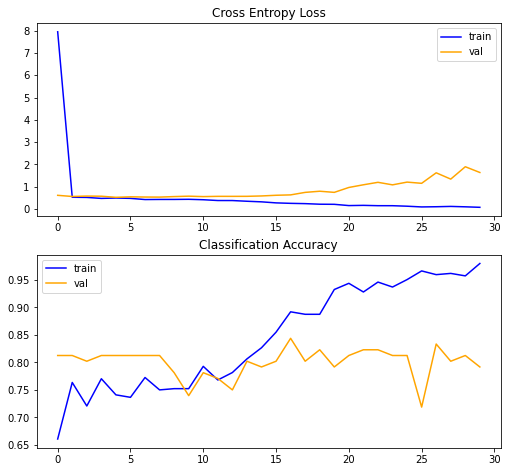

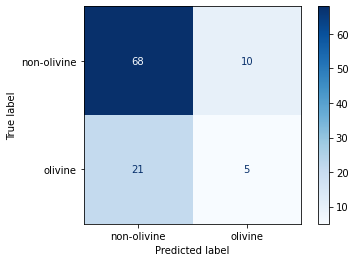

              precision    recall  f1-score   support

 non-olivine       0.76      0.87      0.81        78
     olivine       0.33      0.19      0.24        26

    accuracy                           0.70       104
   macro avg       0.55      0.53      0.53       104
weighted avg       0.66      0.70      0.67       104



In [47]:
evaluate_rotational_model(rot_model, rot_history)

In [42]:
# 100 epochs
rot_model, rot_history = rotational_training(epochs=100)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 224, 224, 32)      1760      
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 112, 112, 32)      0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 56, 56, 64)        0         
_________________________________________________________________
dropout_25 (Dropout)         (None, 56, 56, 64)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 56, 56, 128)      

Epoch 44/100
14/14 [==============================] - 1s 91ms/step - loss: 0.0327 - accuracy: 0.9910 - val_loss: 1.8155 - val_accuracy: 0.8438
Epoch 45/100
14/14 [==============================] - 1s 91ms/step - loss: 0.0266 - accuracy: 0.9865 - val_loss: 1.4519 - val_accuracy: 0.8021
Epoch 46/100
14/14 [==============================] - 1s 92ms/step - loss: 0.0195 - accuracy: 0.9933 - val_loss: 1.5982 - val_accuracy: 0.7604
Epoch 47/100
14/14 [==============================] - 1s 91ms/step - loss: 0.0309 - accuracy: 0.9910 - val_loss: 1.6636 - val_accuracy: 0.7604
Epoch 48/100
14/14 [==============================] - 1s 91ms/step - loss: 0.0269 - accuracy: 0.9932 - val_loss: 1.5168 - val_accuracy: 0.7917
Epoch 49/100
14/14 [==============================] - 1s 90ms/step - loss: 0.0221 - accuracy: 0.9910 - val_loss: 2.4726 - val_accuracy: 0.8229
Epoch 50/100
14/14 [==============================] - 1s 90ms/step - loss: 0.0275 - accuracy: 0.9887 - val_loss: 1.6709 - val_accuracy: 0.7708

104/104 [==============================] - 1s 7ms/step - loss: 3.8463 - accuracy: 0.7788

Accuracy on test set: 77.885


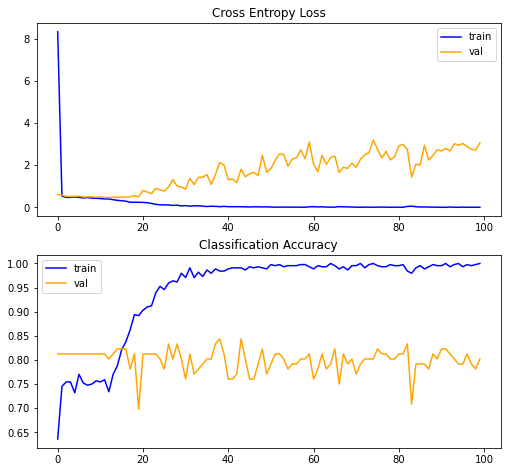

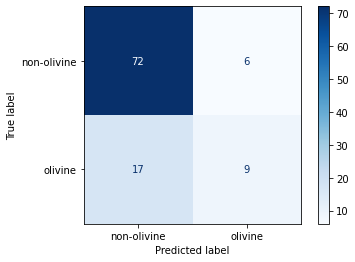

              precision    recall  f1-score   support

 non-olivine       0.81      0.92      0.86        78
     olivine       0.60      0.35      0.44        26

    accuracy                           0.78       104
   macro avg       0.70      0.63      0.65       104
weighted avg       0.76      0.78      0.76       104



In [43]:
evaluate_rotational_model(rot_model, rot_history)

In [17]:
# base cnn model
base_model, base_history = run_test_harness(model_name='base', batch_size=32, epochs=30)

Found 483 images belonging to 2 classes.
Found 103 images belonging to 2 classes.

Classes: {'non-olivine': 0, 'olivine': 1}
Class Weights: {0: 1.0, 1: 3.025}
Class Distribution: {0: 363, 1: 120}

Epoch 1/30
16/16 [==============================] - 10s 597ms/step - loss: 14.9825 - accuracy: 0.5569 - val_loss: 0.6735 - val_accuracy: 0.4272
Epoch 2/30
16/16 [==============================] - 8s 497ms/step - loss: 0.9527 - accuracy: 0.6832 - val_loss: 0.6010 - val_accuracy: 0.6311
Epoch 3/30
16/16 [==============================] - 8s 495ms/step - loss: 0.9932 - accuracy: 0.6584 - val_loss: 0.6485 - val_accuracy: 0.4466
Epoch 4/30
16/16 [==============================] - 8s 489ms/step - loss: 0.9265 - accuracy: 0.6398 - val_loss: 0.6706 - val_accuracy: 0.4272
Epoch 5/30
16/16 [==============================] - 8s 489ms/step - loss: 0.9373 - accuracy: 0.6066 - val_loss: 0.6925 - val_accuracy: 0.4757
Epoch 6/30
16/16 [==============================] - 8s 492ms/step - loss: 0.9356 - accuracy

Found 104 images belonging to 2 classes.
104/104 [==============================] - 1s 8ms/step - loss: 0.5811 - accuracy: 0.5769

Accuracy on test set: 57.692


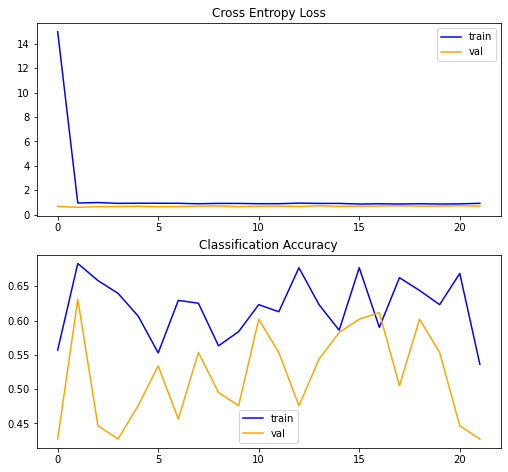

Instructions for updating:
Please use Model.predict, which supports generators.


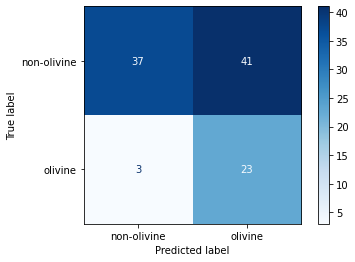

############## Debug ##############
true_classes: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
class_labels: ['non-olivine', 'olivine']
test_generator.samples: 104
              precision    recall  f1-score   support

 non-olivine       0.93      0.47      0.63        78
     olivine       0.36      0.88      0.51        26

    accuracy                           0.58       104
   macro avg       0.64      0.68      0.57       104
weighted avg       0.78      0.58      0.60       104



In [20]:
evaluate_model(base_model, base_history)

thin_section_dataset/test/olivine/12004_r2_olivine_basalt_OLV.jpg


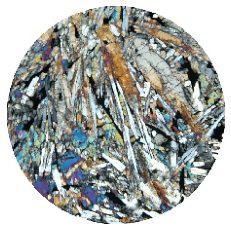

Prediction class: Olivine, Softmax value: 0.53
**************************************************
thin_section_dataset/test/olivine/12015_r1_olivine_vitrophyre_OLV.jpg


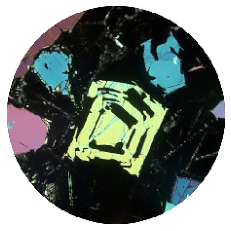

Prediction class: Non-Olivine, Softmax value: 0.14
**************************************************
thin_section_dataset/test/olivine/12015_r2_olivine_vitrophyre_OLV.jpg


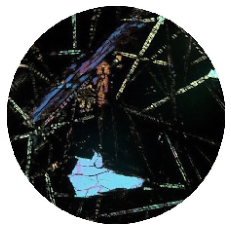

Prediction class: Non-Olivine, Softmax value: 0.04
**************************************************
thin_section_dataset/test/olivine/12040_r2_olivine_basalt_OLV.jpg


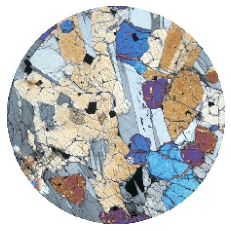

Prediction class: Olivine, Softmax value: 0.65
**************************************************
thin_section_dataset/test/olivine/12076_r2_olivine_basalt_OLV.jpg


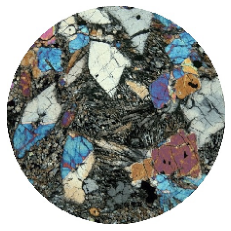

Prediction class: Olivine, Softmax value: 0.57
**************************************************
thin_section_dataset/test/olivine/14066_r2_crystalline_breccia_OLV.jpg


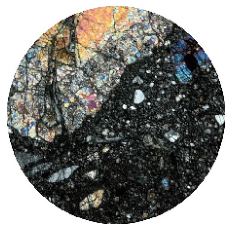

Prediction class: Non-Olivine, Softmax value: 0.26
**************************************************
thin_section_dataset/test/olivine/14305_r2_polymict_breccia_OLV.jpg


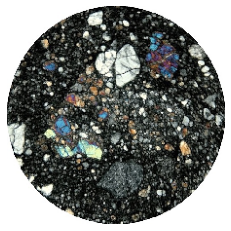

Prediction class: Non-Olivine, Softmax value: 0.19
**************************************************
thin_section_dataset/test/olivine/15016_r1_vesicular_olivine_basalt_OLV.jpg


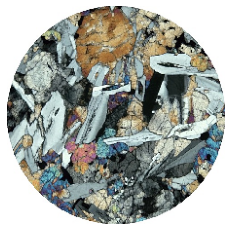

Prediction class: Non-Olivine, Softmax value: 0.47
**************************************************
thin_section_dataset/test/olivine/15065_r1_pigeonite_basalt_OLV.jpg


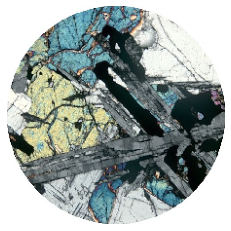

Prediction class: Non-Olivine, Softmax value: 0.39
**************************************************
thin_section_dataset/test/olivine/15105_r2_olivine_phyric_basalt_OLV.jpg


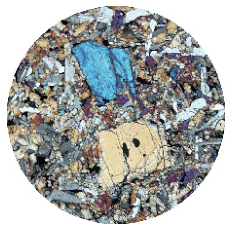

Prediction class: Olivine, Softmax value: 0.63
**************************************************
thin_section_dataset/test/olivine/15356_r1_impact_melt_OLV.jpg


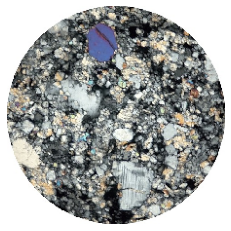

Prediction class: Olivine, Softmax value: 0.55
**************************************************
thin_section_dataset/test/olivine/15379_r1_shocked_olivine_basalt_OLV.jpg


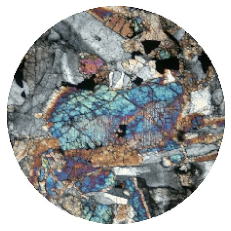

Prediction class: Olivine, Softmax value: 0.57
**************************************************
thin_section_dataset/test/olivine/15556_r1_vesicular_olivine_basalt_OLV.jpg


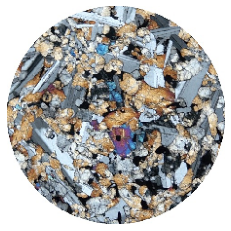

Prediction class: Olivine, Softmax value: 0.53
**************************************************
thin_section_dataset/test/olivine/15558_r1_regolith_breccia_OLV.jpg


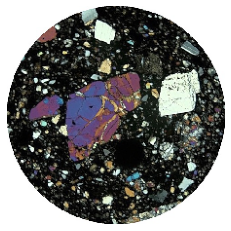

Prediction class: Non-Olivine, Softmax value: 0.11
**************************************************
thin_section_dataset/test/olivine/15610_r1_coarse_olivine_basalt_OLV.jpg


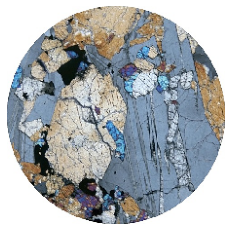

Prediction class: Olivine, Softmax value: 0.62
**************************************************
thin_section_dataset/test/olivine/15614_r1_vesicular_olivine_basalt_OLV.jpg


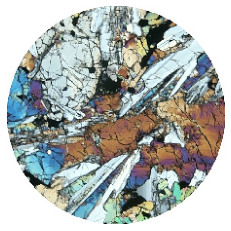

Prediction class: Olivine, Softmax value: 0.57
**************************************************
thin_section_dataset/test/olivine/15623_r1_vesicular_olivine_basalt_OLV.jpg


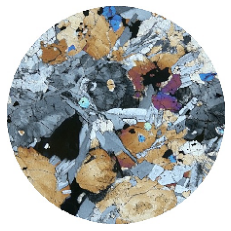

Prediction class: Olivine, Softmax value: 0.59
**************************************************
thin_section_dataset/test/olivine/15623_r2_vesicular_olivine_basalt_OLV.jpg


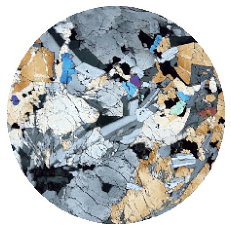

Prediction class: Olivine, Softmax value: 0.58
**************************************************
thin_section_dataset/test/olivine/15636_r2_olivine_basalt_OLV.jpg


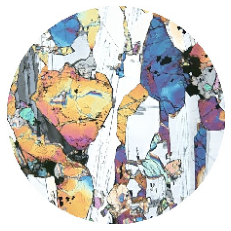

Prediction class: Olivine, Softmax value: 0.63
**************************************************
thin_section_dataset/test/olivine/15641_r2_coarse_olivine_basalt_OLV.jpg


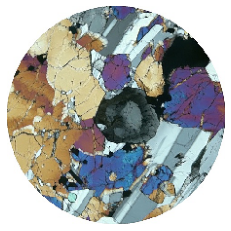

Prediction class: Olivine, Softmax value: 0.65
**************************************************
thin_section_dataset/test/olivine/15643_r2_coarse_olivine_basalt_OLV.jpg


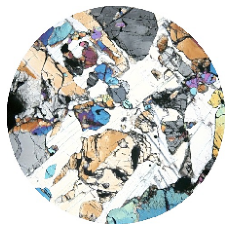

Prediction class: Olivine, Softmax value: 0.55
**************************************************
thin_section_dataset/test/olivine/15663_r2_coarse_olivine_basalt_OLV.jpg


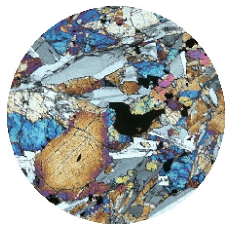

Prediction class: Olivine, Softmax value: 0.61
**************************************************
thin_section_dataset/test/olivine/15665_r2_olivine_basalt_OLV.jpg


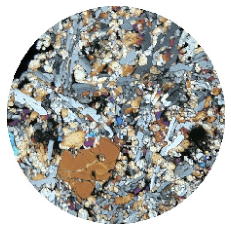

Prediction class: Olivine, Softmax value: 0.52
**************************************************
thin_section_dataset/test/olivine/67016_r1_immature_feldspathic_regolith_breccia_OLV.jpg


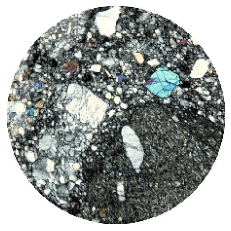

Prediction class: Non-Olivine, Softmax value: 0.50
**************************************************
thin_section_dataset/test/olivine/rbt04262_r1_Martian_meteorites_pyroxene_olivine_maskelynite_glass_OLV.jpg


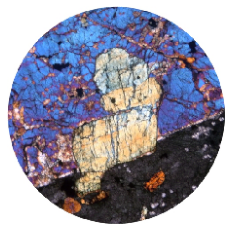

Prediction class: Olivine, Softmax value: 0.81
**************************************************
thin_section_dataset/test/olivine/smg117_r1_peridotite_olivine_pyroxene_chromite_plagioclase_feldspar_OLV.jpg


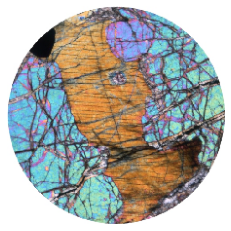

Prediction class: Olivine, Softmax value: 0.67
**************************************************


In [131]:
predict_images(olivine_folder, base_model)

thin_section_dataset/test/non-olivine/10018_r1_regolith_breccia_NOLV.jpg


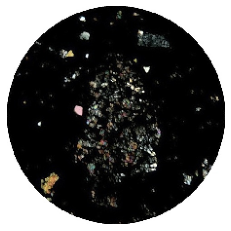

Prediction class: Non-Olivine, Softmax value: 0.03
**************************************************
thin_section_dataset/test/non-olivine/10022_r1_ilmenite_basalt_NOLV.jpg


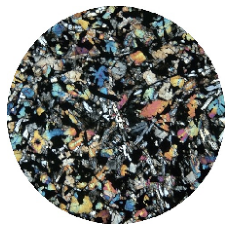

Prediction class: Non-Olivine, Softmax value: 0.37
**************************************************
thin_section_dataset/test/non-olivine/10031_r1_high_k_ilmenite_basalt_NOLV.jpg


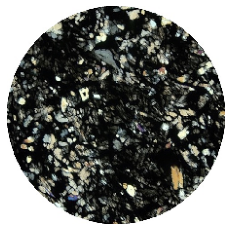

Prediction class: Non-Olivine, Softmax value: 0.02
**************************************************
thin_section_dataset/test/non-olivine/10032_r2_ilmenite_basalt_NOLV.jpg


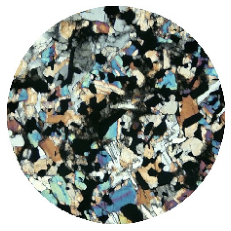

Prediction class: Non-Olivine, Softmax value: 0.28
**************************************************
thin_section_dataset/test/non-olivine/10045_r2_ilmenite_basalt_NOLV.jpg


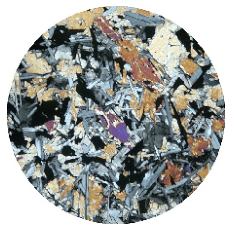

Prediction class: Non-Olivine, Softmax value: 0.47
**************************************************
thin_section_dataset/test/non-olivine/10046_r2_basaltic_regolith_breccia_NOLV.jpg


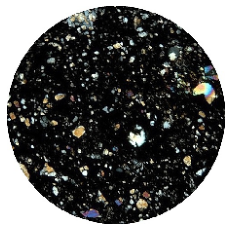

Prediction class: Non-Olivine, Softmax value: 0.00
**************************************************
thin_section_dataset/test/non-olivine/10048_r1_grey_regolith_breccia_NOLV.jpg


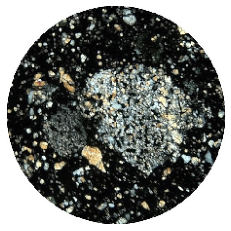

Prediction class: Non-Olivine, Softmax value: 0.05
**************************************************
thin_section_dataset/test/non-olivine/10048_r2_grey_regolith_breccia_NOLV.jpg


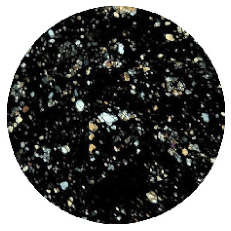

Prediction class: Non-Olivine, Softmax value: 0.00
**************************************************
thin_section_dataset/test/non-olivine/10050_r1_coarse_grained_ilmenite_basalt_NOLV.jpg


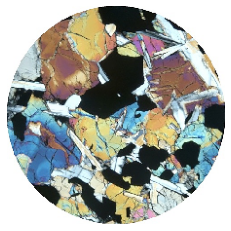

Prediction class: Non-Olivine, Softmax value: 0.40
**************************************************
thin_section_dataset/test/non-olivine/10058_r1_coarse_grained_ilmenite_basalt_NOLV.jpg


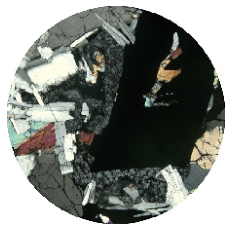

Prediction class: Non-Olivine, Softmax value: 0.25
**************************************************
thin_section_dataset/test/non-olivine/10065_r2_regolith_breccia_NOLV.jpg


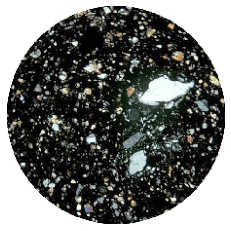

Prediction class: Non-Olivine, Softmax value: 0.01
**************************************************
thin_section_dataset/test/non-olivine/10070_r1_regolith_breccia_NOLV.jpg


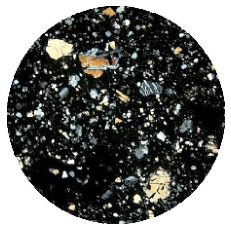

Prediction class: Non-Olivine, Softmax value: 0.00
**************************************************
thin_section_dataset/test/non-olivine/10071_r2_high_ti_basalt_NOLV.jpg


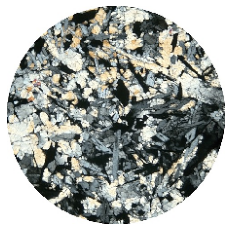

Prediction class: Non-Olivine, Softmax value: 0.35
**************************************************
thin_section_dataset/test/non-olivine/10082_r2_regolith_breccia_NOLV.jpg


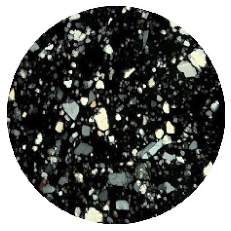

Prediction class: Non-Olivine, Softmax value: 0.01
**************************************************
thin_section_dataset/test/non-olivine/10085_r2_coarse_grained_basalt_NOLV.jpg


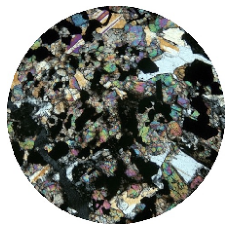

Prediction class: Non-Olivine, Softmax value: 0.27
**************************************************
thin_section_dataset/test/non-olivine/12013_r1_breccia_granite_NOLV.jpg


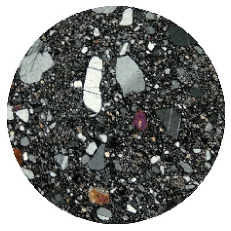

Prediction class: Non-Olivine, Softmax value: 0.37
**************************************************
thin_section_dataset/test/non-olivine/12013_r2_breccia_granite_NOLV.jpg


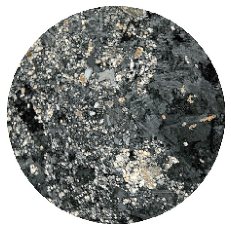

Prediction class: Non-Olivine, Softmax value: 0.46
**************************************************
thin_section_dataset/test/non-olivine/12036_r2_olivine_basalt_NOLV.jpg


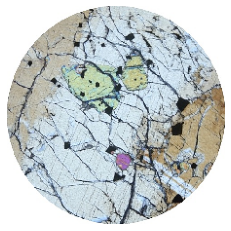

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/12047_r2_ilmenite_basalt_NOLV.jpg


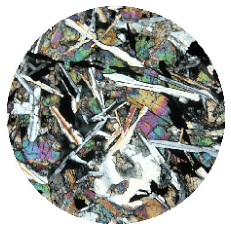

Prediction class: Non-Olivine, Softmax value: 0.46
**************************************************
thin_section_dataset/test/non-olivine/12055_r2_pigeonite_basalt_NOLV.jpg


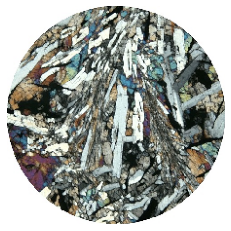

Prediction class: Non-Olivine, Softmax value: 0.49
**************************************************
thin_section_dataset/test/non-olivine/12061_r1_ilmenite_basalt_NOLV.jpg


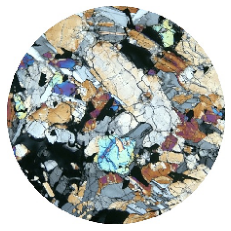

Prediction class: Olivine, Softmax value: 0.51
**************************************************
thin_section_dataset/test/non-olivine/12061_r2_ilmenite_basalt_NOLV.jpg


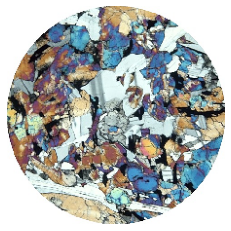

Prediction class: Olivine, Softmax value: 0.67
**************************************************
thin_section_dataset/test/non-olivine/12065_r2_pigeonite_basalt_NOLV.jpg


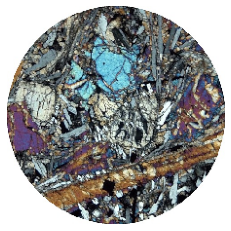

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/12073_r2_regolith_breccia_NOLV.jpg


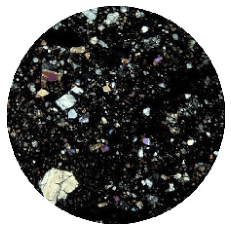

Prediction class: Non-Olivine, Softmax value: 0.01
**************************************************
thin_section_dataset/test/non-olivine/14041_r1_regolith_breccia_NOLV.jpg


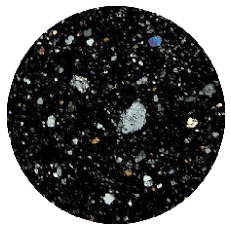

Prediction class: Non-Olivine, Softmax value: 0.00
**************************************************
thin_section_dataset/test/non-olivine/14047_r1_regolith_breccia_NOLV.jpg


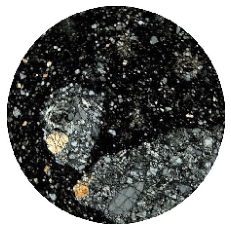

Prediction class: Non-Olivine, Softmax value: 0.02
**************************************************
thin_section_dataset/test/non-olivine/14047_r2_regolith_breccia_NOLV.jpg


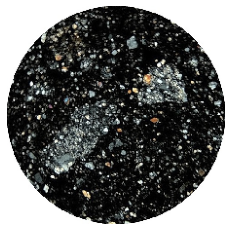

Prediction class: Non-Olivine, Softmax value: 0.00
**************************************************
thin_section_dataset/test/non-olivine/14055_r2_regolith_breccia_NOLV.jpg


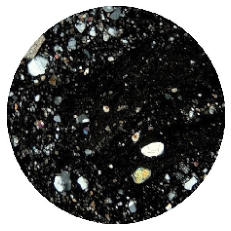

Prediction class: Non-Olivine, Softmax value: 0.02
**************************************************
thin_section_dataset/test/non-olivine/14063_r1_light_matrix_breccia_NOLV.jpg


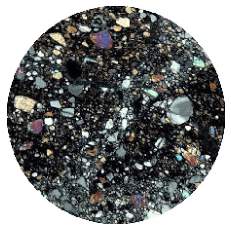

Prediction class: Non-Olivine, Softmax value: 0.20
**************************************************
thin_section_dataset/test/non-olivine/14070_r1_crystalline_breccia_NOLV.jpg


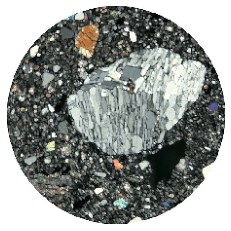

Prediction class: Non-Olivine, Softmax value: 0.46
**************************************************
thin_section_dataset/test/non-olivine/14073_r2_basalt_NOLV.jpg


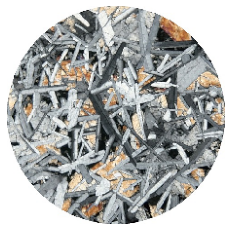

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/14077_r2_basalt_NOLV.jpg


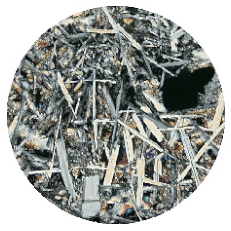

Prediction class: Non-Olivine, Softmax value: 0.47
**************************************************
thin_section_dataset/test/non-olivine/14179_r1_breccia_clasts_NOLV.jpg


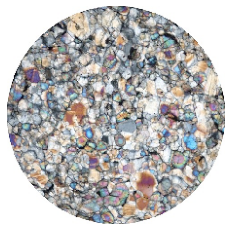

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/14255_r1_regolith_breccia_NOLV.jpg


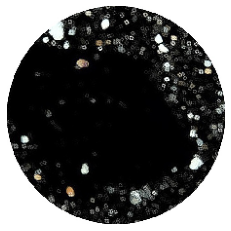

Prediction class: Non-Olivine, Softmax value: 0.04
**************************************************
thin_section_dataset/test/non-olivine/14274_r1_crystalline_matrix_breccia_NOLV.jpg


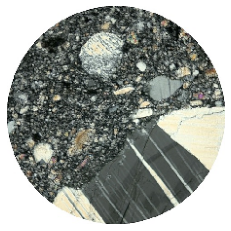

Prediction class: Olivine, Softmax value: 0.52
**************************************************
thin_section_dataset/test/non-olivine/14310_r1_impact_melt_breccia_NOLV.jpg


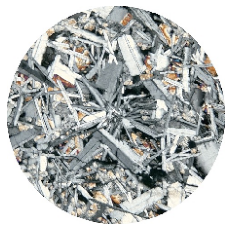

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/14311_r2_impact_melt_breccia_NOLV.jpg


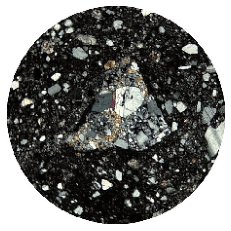

Prediction class: Non-Olivine, Softmax value: 0.07
**************************************************
thin_section_dataset/test/non-olivine/14316_r2_unusual_regolith_breccia_NOLV.jpg


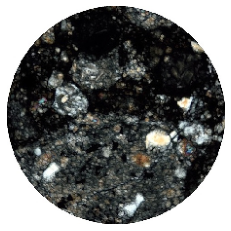

Prediction class: Non-Olivine, Softmax value: 0.19
**************************************************
thin_section_dataset/test/non-olivine/14320_r2_crystalline_matrix_breccia_NOLV.jpg


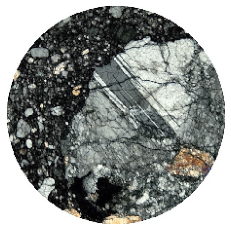

Prediction class: Non-Olivine, Softmax value: 0.37
**************************************************
thin_section_dataset/test/non-olivine/15065_r2_pigeonite_basalt_NOLV.jpg


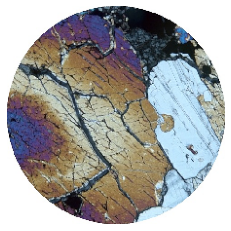

Prediction class: Olivine, Softmax value: 0.61
**************************************************
thin_section_dataset/test/non-olivine/15076_r1_pigeonite_basalt_NOLV.jpg


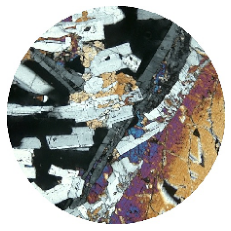

Prediction class: Non-Olivine, Softmax value: 0.44
**************************************************
thin_section_dataset/test/non-olivine/15095_r2_glass_covered_breccia_NOLV.jpg


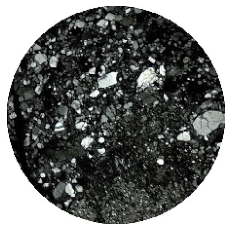

Prediction class: Non-Olivine, Softmax value: 0.08
**************************************************
thin_section_dataset/test/non-olivine/15265_r1_regolith_breccia_NOLV.jpg


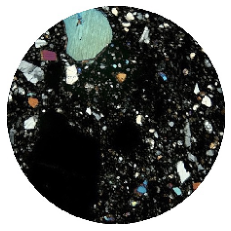

Prediction class: Non-Olivine, Softmax value: 0.01
**************************************************
thin_section_dataset/test/non-olivine/15285_r2_regolith_breccia_NOLV.jpg


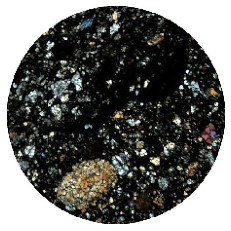

Prediction class: Non-Olivine, Softmax value: 0.01
**************************************************
thin_section_dataset/test/non-olivine/15286_r2_regolith_breccia_NOLV.jpg


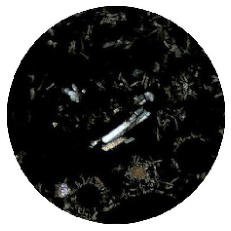

Prediction class: Non-Olivine, Softmax value: 0.08
**************************************************
thin_section_dataset/test/non-olivine/15295_r1_regolith_breccia_NOLV.jpg


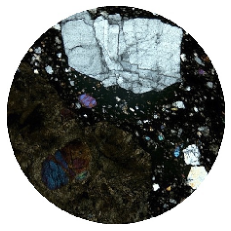

Prediction class: Non-Olivine, Softmax value: 0.09
**************************************************
thin_section_dataset/test/non-olivine/15298_r2_regolith_breccia_NOLV.jpg


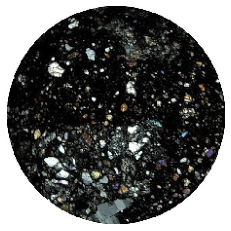

Prediction class: Non-Olivine, Softmax value: 0.02
**************************************************
thin_section_dataset/test/non-olivine/15325_r1_regolith_breccia_NOLV.jpg


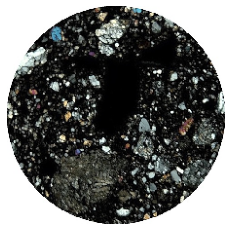

Prediction class: Non-Olivine, Softmax value: 0.02
**************************************************
thin_section_dataset/test/non-olivine/15330_r2_regolith_breccia_NOLV.jpg


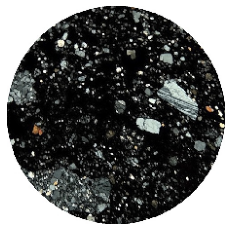

Prediction class: Non-Olivine, Softmax value: 0.00
**************************************************
thin_section_dataset/test/non-olivine/15371_r1_green_volcanic_glass_NOLV.jpg


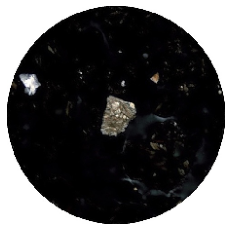

Prediction class: Non-Olivine, Softmax value: 0.18
**************************************************
thin_section_dataset/test/non-olivine/15371_r2_green_volcanic_glass_NOLV.jpg


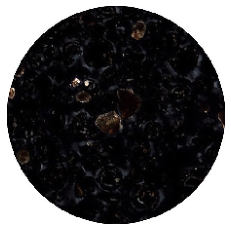

Prediction class: Non-Olivine, Softmax value: 0.14
**************************************************
thin_section_dataset/test/non-olivine/15405_r2_impact_melt_breccia_NOLV.jpg


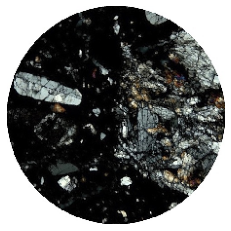

Prediction class: Non-Olivine, Softmax value: 0.09
**************************************************
thin_section_dataset/test/non-olivine/15415_r1_ferroan_anorthosite_NOLV.jpg


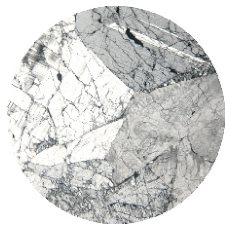

Prediction class: Olivine, Softmax value: 0.53
**************************************************
thin_section_dataset/test/non-olivine/15418_r2_heavily_shocked_granulite_NOLV.jpg


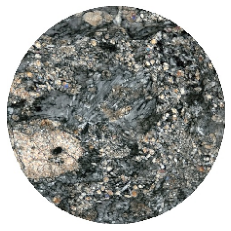

Prediction class: Olivine, Softmax value: 0.53
**************************************************
thin_section_dataset/test/non-olivine/15426_r1_green_glass_clods_NOLV.jpg


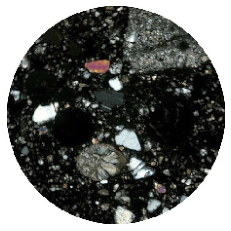

Prediction class: Non-Olivine, Softmax value: 0.10
**************************************************
thin_section_dataset/test/non-olivine/15465_r2_glass_breccia_clasts_NOLV.jpg


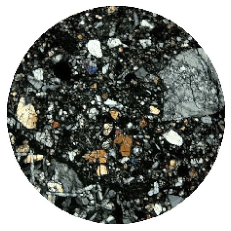

Prediction class: Non-Olivine, Softmax value: 0.11
**************************************************
thin_section_dataset/test/non-olivine/15476_r2_porphyritic_pigeonite_basalt_NOLV.jpg


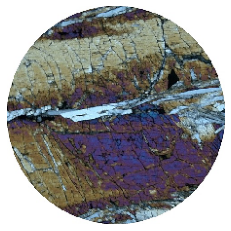

Prediction class: Olivine, Softmax value: 0.67
**************************************************
thin_section_dataset/test/non-olivine/15546_r1_coarse_grained_olivine_basalt_NOLV.jpg


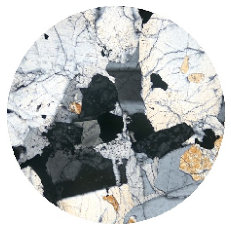

Prediction class: Non-Olivine, Softmax value: 0.48
**************************************************
thin_section_dataset/test/non-olivine/15565_r2_regolith_breccia_NOLV.jpg


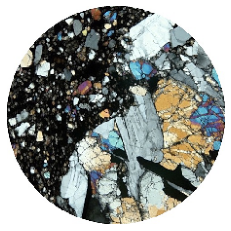

Prediction class: Non-Olivine, Softmax value: 0.17
**************************************************
thin_section_dataset/test/non-olivine/15596_r1_vuggy_vitrophyric_pigeonite_basalt_NOLV.jpg


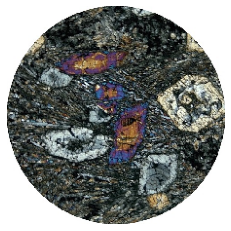

Prediction class: Non-Olivine, Softmax value: 0.44
**************************************************
thin_section_dataset/test/non-olivine/60025_r2_anorthosite_cataclasite_NOLV.jpg


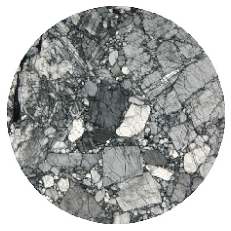

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/68501_r2_highland_regolith_soil_NOLV.jpg


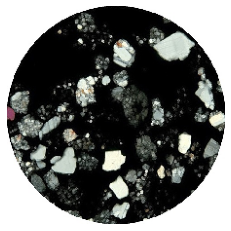

Prediction class: Non-Olivine, Softmax value: 0.03
**************************************************
thin_section_dataset/test/non-olivine/70181_r1_mature_mare_regolith_NOLV.jpg


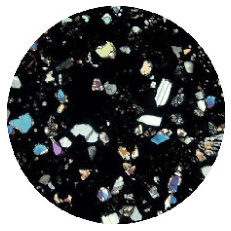

Prediction class: Non-Olivine, Softmax value: 0.01
**************************************************
thin_section_dataset/test/non-olivine/71035_r2_high_titanium_basalt_NOLV.jpg


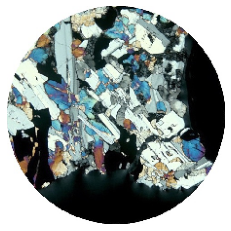

Prediction class: Non-Olivine, Softmax value: 0.27
**************************************************
thin_section_dataset/test/non-olivine/angeles_r1_basaltic_shergottite_pyroxene_maskelynite_glass_olivine_titanomagnetite_NOLV.jpg


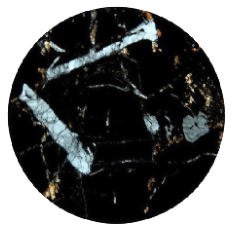

Prediction class: Non-Olivine, Softmax value: 0.09
**************************************************
thin_section_dataset/test/non-olivine/barwell_r1_l6_olivine_pyroxene_troilite_metallic_iron_NOLV.jpg


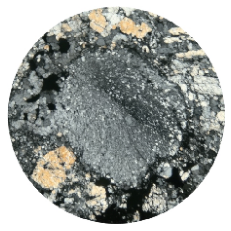

Prediction class: Non-Olivine, Softmax value: 0.50
**************************************************
thin_section_dataset/test/non-olivine/du9873_r1_basalt_olivine_pyroxene_plagioclase_feldspar_iron_oxide_NOLV.jpg


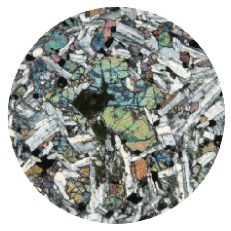

Prediction class: Olivine, Softmax value: 0.51
**************************************************
thin_section_dataset/test/non-olivine/eucrite1_r1_gabbro_olivine_pyroxene_plagioclase_feldspar_iron_oxide_NOLV.jpg


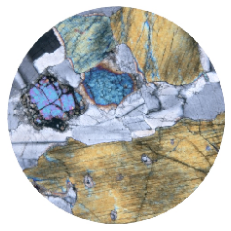

Prediction class: Olivine, Softmax value: 0.68
**************************************************
thin_section_dataset/test/non-olivine/glatton_r1_l6_olivine_pyroxene_troilite_metallic_iron_NOLV.jpg


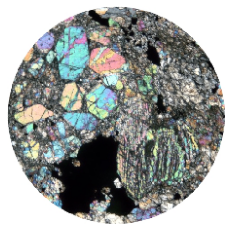

Prediction class: Non-Olivine, Softmax value: 0.48
**************************************************
thin_section_dataset/test/non-olivine/pontlyfni_r2_Winonaite_olivine_pyroxene_troilite_metallic_iron_NOLV.jpg


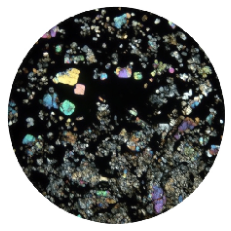

Prediction class: Non-Olivine, Softmax value: 0.06
**************************************************
thin_section_dataset/test/non-olivine/rbt04261_r1_basaltic_shergottite_olivine_pyroxene_maskelynite_glass_NOLV.jpg


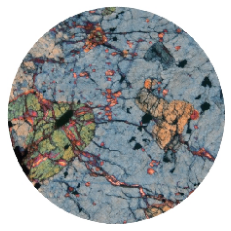

Prediction class: Olivine, Softmax value: 0.58
**************************************************
thin_section_dataset/test/non-olivine/s339_01_r1_basalt_pyroxene_olivine_iron_oxide_NOLV.jpg


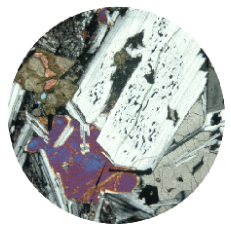

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/s339_06_r3_basalt_olivine_pyroxene_plagioclase_feldspar_iron_oxide_NOLV.jpg


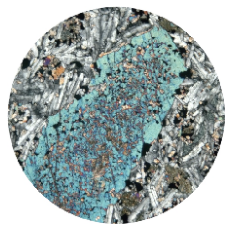

Prediction class: Olivine, Softmax value: 0.59
**************************************************
thin_section_dataset/test/non-olivine/shergotty_r1_basaltic_shergottite_pyroxene_olivine_maskelynite_glass_cristobalite_ilmenite_magnetite_pyrrhotite_apatite_whitlockite_amphibole_baddeleyite_fayalite_hercynite_majorite_NOLV.jpg


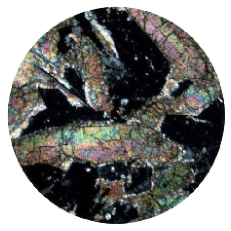

Prediction class: Non-Olivine, Softmax value: 0.25
**************************************************
thin_section_dataset/test/non-olivine/shergotty_r2_basaltic_shergottite_pyroxene_olivine_maskelynite_glass_cristobalite_ilmenite_magnetite_pyrrhotite_apatite_whitlockite_amphibole_baddeleyite_fayalite_hercynite_majorite_NOLV.jpg


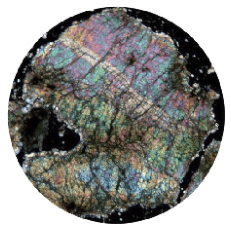

Prediction class: Non-Olivine, Softmax value: 0.43
**************************************************
thin_section_dataset/test/non-olivine/tc_p32000_r2_basalt_clinopyroxene_olivine_feldspar_magnetite_NOLV.jpg


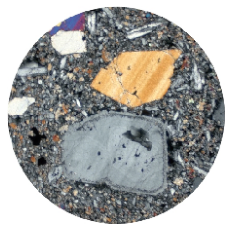

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/tc_p5546_r1_marble_calcite_dolomite_olivine_clinopyroxene_NOLV.jpg


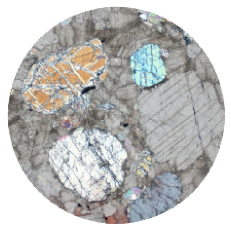

Prediction class: Olivine, Softmax value: 0.54
**************************************************
thin_section_dataset/test/non-olivine/tissint_r2_shergottite_achondrite_olivine_pyroxene_maskelynite_glass_chromite_merrillite_NOLV.jpg


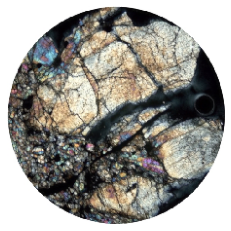

Prediction class: Non-Olivine, Softmax value: 0.43
**************************************************


In [127]:
predict_images(non_olivine_folder, base_model)

In [139]:
# entry point, run the test harness
# custom vgg model
custom_vgg_model, custom_vgg_history = run_test_harness(model_name='custom_vgg', epochs=50)

Found 483 images belonging to 2 classes.
Found 103 images belonging to 2 classes.

Classes: {'non-olivine': 0, 'olivine': 1}
Class Weights: {0: 1.0, 1: 3.025}
Class Distribution: {0: 363, 1: 120}

Epoch 1/50
16/16 [==============================] - 9s 565ms/step - loss: 1.8965 - accuracy: 0.4244 - val_loss: 0.6408 - val_accuracy: 0.7573
Epoch 2/50
16/16 [==============================] - 9s 546ms/step - loss: 1.3481 - accuracy: 0.4928 - val_loss: 0.6129 - val_accuracy: 0.7573
Epoch 3/50
16/16 [==============================] - 9s 547ms/step - loss: 1.1490 - accuracy: 0.5259 - val_loss: 0.7383 - val_accuracy: 0.2427
Epoch 4/50
16/16 [==============================] - 9s 544ms/step - loss: 1.0738 - accuracy: 0.5052 - val_loss: 0.6886 - val_accuracy: 0.7573
Epoch 5/50
16/16 [==============================] - 9s 558ms/step - loss: 1.0796 - accuracy: 0.4720 - val_loss: 0.6697 - val_accuracy: 0.7573
Epoch 6/50
16/16 [==============================] - 9s 536ms/step - loss: 1.0573 - accuracy: 

Found 104 images belonging to 2 classes.
104/104 [==============================] - 2s 16ms/step - loss: 0.6971 - accuracy: 0.2500

Accuracy on test set: 25.000


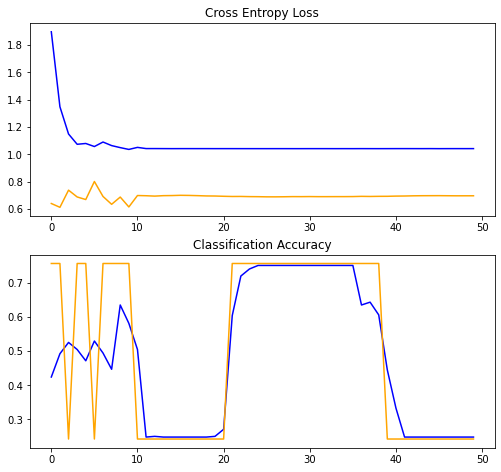

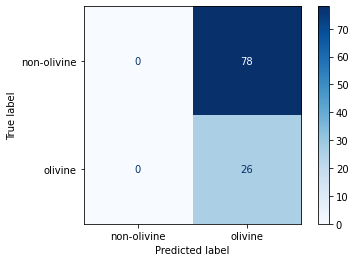

              precision    recall  f1-score   support

 non-olivine       0.00      0.00      0.00        78
     olivine       0.25      1.00      0.40        26

    accuracy                           0.25       104
   macro avg       0.12      0.50      0.20       104
weighted avg       0.06      0.25      0.10       104



C:\Users\jlewe\anaconda3\envs\ESA_37\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jlewe\anaconda3\envs\ESA_37\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jlewe\anaconda3\envs\ESA_37\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [140]:
evaluate_model(custom_vgg_model, custom_vgg_history)

In [44]:
# entry point, run the test harness
# transfer learnin vgg model
vgg_model, vgg_history = run_test_harness(model_name='vgg', epochs=10, batch_size=32, index=22, verbose=1)

Found 483 images belonging to 2 classes.
Found 103 images belonging to 2 classes.

Classes: {'non-olivine': 0, 'olivine': 1}
Class Weights: {0: 1.0, 1: 3.025}
Class Distribution: {0: 363, 1: 120}

Epoch 1/10
16/16 [==============================] - 8s 530ms/step - loss: 1.0216 - acc: 0.7288 - val_loss: 0.6821 - val_acc: 0.7670
Epoch 2/10
16/16 [==============================] - 8s 493ms/step - loss: 1.0049 - acc: 0.7578 - val_loss: 0.5711 - val_acc: 0.7573
Epoch 3/10
16/16 [==============================] - 8s 498ms/step - loss: 1.0444 - acc: 0.4762 - val_loss: 0.6932 - val_acc: 0.2427
Epoch 4/10
16/16 [==============================] - 8s 501ms/step - loss: 1.0353 - acc: 0.2671 - val_loss: 0.6954 - val_acc: 0.2427
Epoch 5/10
16/16 [==============================] - 8s 494ms/step - loss: 1.0421 - acc: 0.2505 - val_loss: 0.6933 - val_acc: 0.2427
Epoch 6/10
16/16 [==============================] - 8s 494ms/step - loss: 1.0286 - acc: 0.2547 - val_loss: 0.6927 - val_acc: 0.2427
Epoch 7/10


Found 104 images belonging to 2 classes.
104/104 [==============================] - 2s 15ms/step - loss: 0.6930 - acc: 0.5192

Accuracy on test set: 51.923


KeyError: 'accuracy'

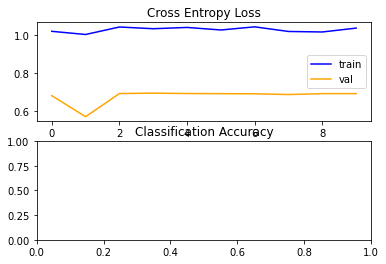

In [45]:
evaluate_model(vgg_model, vgg_history)

In [14]:
# resnet model
resnet_model, resnet_history = run_test_harness(model_name='resnet50', epochs=20, index=22, verbose=1)

Found 483 images belonging to 2 classes.
Found 103 images belonging to 2 classes.

Classes: {'non-olivine': 0, 'olivine': 1}
Class Weights: {0: 1.0, 1: 3.025}
Class Distribution: {0: 363, 1: 120}

Epoch 1/20
16/16 [==============================] - 11s 705ms/step - loss: 1.0662 - accuracy: 0.6501 - val_loss: 0.6867 - val_accuracy: 0.7573
Epoch 2/20
16/16 [==============================] - 9s 548ms/step - loss: 1.0412 - accuracy: 0.7516 - val_loss: 0.6901 - val_accuracy: 0.7573
Epoch 3/20
16/16 [==============================] - 10s 631ms/step - loss: 1.0413 - accuracy: 0.7516 - val_loss: 0.6885 - val_accuracy: 0.7573
Epoch 4/20
16/16 [==============================] - 10s 601ms/step - loss: 1.0405 - accuracy: 0.7516 - val_loss: 0.6778 - val_accuracy: 0.7573
Epoch 5/20
16/16 [==============================] - 10s 600ms/step - loss: 1.0504 - accuracy: 0.7516 - val_loss: 0.6931 - val_accuracy: 0.7573
Epoch 6/20
16/16 [==============================] - 10s 644ms/step - loss: 1.0419 - accur

Found 104 images belonging to 2 classes.
Instructions for updating:
Please use Model.evaluate, which supports generators.
104/104 [==============================] - 2s 20ms/step - loss: 0.6931 - accuracy: 0.7500

Accuracy on test set: 75.000


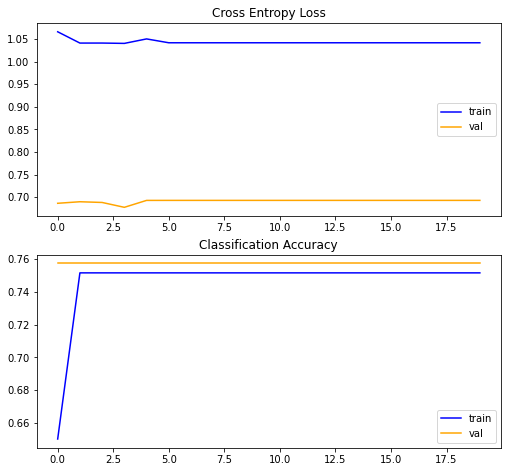

Instructions for updating:
Please use Model.predict, which supports generators.


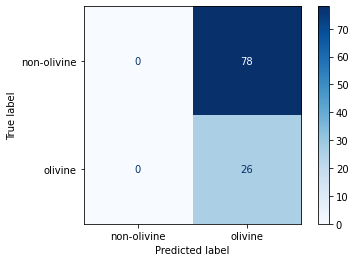

              precision    recall  f1-score   support

 non-olivine       0.00      0.00      0.00        78
     olivine       0.25      1.00      0.40        26

    accuracy                           0.25       104
   macro avg       0.12      0.50      0.20       104
weighted avg       0.06      0.25      0.10       104



C:\Users\jlewe\anaconda3\envs\ESA_37\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jlewe\anaconda3\envs\ESA_37\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jlewe\anaconda3\envs\ESA_37\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [15]:
evaluate_model(resnet_model, resnet_history)